<class 'pandas.core.frame.DataFrame'>
Int64Index: 11835 entries, 6386 to 190655
Data columns (total 5 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   dateTime           11835 non-null  object 
 1   temperature        0 non-null      float64
 2   salinity           0 non-null      float64
 3   condolence         0 non-null      float64
 4   electricPotential  11835 non-null  float64
dtypes: float64(4), object(1)
memory usage: 554.8+ KB
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 190656 entries, 0 to 190655
Data columns (total 5 columns):
 #   Column             Non-Null Count   Dtype  
---  ------             --------------   -----  
 0   dateTime           190656 non-null  object 
 1   temperature        170187 non-null  float64
 2   salinity           166470 non-null  float64
 3   condolence         178774 non-null  float64
 4   electricPotential  11835 non-null   float64
dtypes: float64(4), object(1)
memory usage: 7

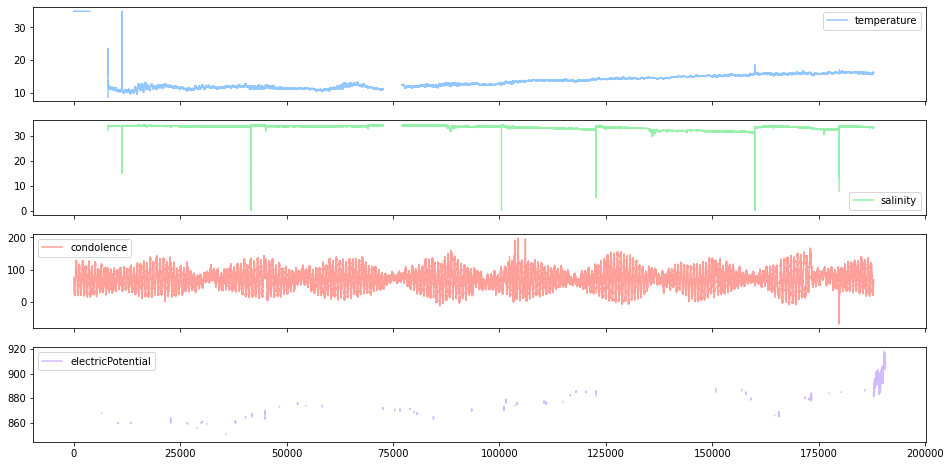

In [8]:
import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)
import matplotlib.pyplot as plt
import seaborn as sns
from scipy import stats

import os
for dirname, _, filenames in os.walk('./Gwangan/광안대교앵커리지1_20210101_20210731.csv'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

plt.style.use(['seaborn-pastel'])        
        
df = pd.read_csv('./Gwangan/광안대교앵커리지1_20210101_20210731.csv')

df.rename(columns = {"Unnamed: 0" : "Day"},inplace = True)

df_prophet = df.copy()
df_prophet.dropna(axis=0, subset=['electricPotential'], inplace = True)
df_prophet['electricPotential'] = 1 * df_prophet['electricPotential']
df_prophet.info()
df.info()

df.plot(figsize=(16,8), subplots=True)
plt.show()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 190656 entries, 2021-01-01 00:00:00 to 2021-07-12 23:14:46
Data columns (total 4 columns):
 #   Column       Non-Null Count   Dtype  
---  ------       --------------   -----  
 0   dateTime     190656 non-null  object 
 1   temperature  170187 non-null  float64
 2   salinity     166470 non-null  float64
 3   condolence   178774 non-null  float64
dtypes: float64(3), object(1)
memory usage: 7.3+ MB


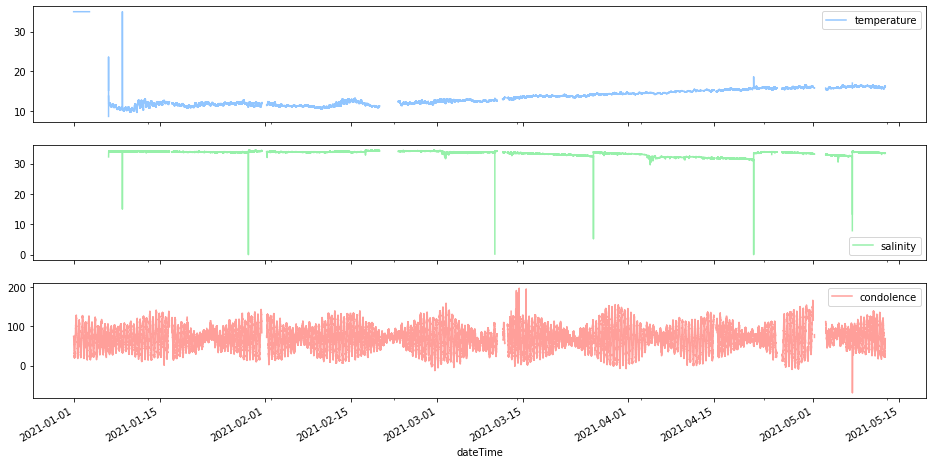

In [9]:
df_not_elec = df.drop(['electricPotential'], axis=1)

df_not_elec = df_not_elec.set_index(pd.to_datetime(df['dateTime']))
df_not_elec.info()

df_not_elec.plot(figsize=(16,8), subplots=True)
plt.show()

In [10]:
df = df.set_index(pd.to_datetime(df['dateTime']))
df

,dateTime,temperature,salinity,condolence,electricPotential
dateTime,,,,,
2021-01-01 00:00:00,2021-01-01 00:00:00,35.0,NaN,75.0,NaN
2021-01-01 00:01:00,2021-01-01 00:01:00,35.0,NaN,75.0,NaN
2021-01-01 00:02:00,2021-01-01 00:02:00,35.0,NaN,75.0,NaN
2021-01-01 00:03:00,2021-01-01 00:03:00,35.0,NaN,75.0,NaN
2021-01-01 00:04:00,2021-01-01 00:04:00,35.0,NaN,74.0,NaN
...,...,...,...,...,...
2021-07-12 22:11:28,2021-07-12 22:11:28,NaN,NaN,NaN,909.0
2021-07-12 22:14:45,2021-07-12 22:14:45,NaN,NaN,NaN,909.0
2021-07-12 23:04:44,2021-07-12 23:04:44,NaN,NaN,NaN,910.0


In [11]:
#결측값 채우기

if df['electricPotential'].notnull:
    if df['salinity'].isnull:
        df['salinity'].interpolate(method='bfill', inplace=True)
    if df['condolence'].isnull:
        df['condolence'].interpolate(method='bfill', inplace=True)
    if df['temperature'].isnull:
        df['temperature'].interpolate(method='bfill', inplace=True)
    #df['salinity'].interpolate(method='pad', inplace=True)
    #df['condolence'].interpolate(method='pad', inplace=True)
    #df['temperature'].interpolate(method='pad', inplace=True)

df.info()


<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 190656 entries, 2021-01-01 00:00:00 to 2021-07-12 23:14:46
Data columns (total 5 columns):
 #   Column             Non-Null Count   Dtype  
---  ------             --------------   -----  
 0   dateTime           190656 non-null  object 
 1   temperature        187878 non-null  float64
 2   salinity           187878 non-null  float64
 3   condolence         187878 non-null  float64
 4   electricPotential  11835 non-null   float64
dtypes: float64(4), object(1)
memory usage: 8.7+ MB


In [12]:
#1시간단위로 데이터 자르기
df_test['temperature'] = df['temperature'].resample('1H').first()
df_test['salinity'] = df['salinity'].resample('1H').first()
df_test['condolence'] = df['condolence'].resample('1H').first()
df_test['electricPotential'] =  df['electricPotential'].resample('1H').first()
df_test

NameError: name 'df_test' is not defined

In [13]:
df_test.head()
df_test.plot(figsize=(16,8), subplots=True)
plt.show()

NameError: name 'df_test' is not defined

In [14]:
#df_test['salinity'].fillna(method='pad', inplace=True)
#df_test['condolence'].fillna(method='pad', inplace=True)
#df_test['temperature'].fillna(method='pad', inplace=True)
#df_test['electricPotential'].fillna(method='pad', inplace=True)
#df_test['dateTime'].fillna(method='pad', inplace=True)
#df_test['salinity'].fillna(method='bfill', inplace=True)
#df_test['condolence'].fillna(method='bfill', inplace=True)
#df_test['temperature'].fillna(method='bfill', inplace=True)
#df_test['electricPotential'].fillna(method='bfill', inplace=True)


##이상값 처리

quartiles = np.percentile(df_test['salinity'],[25,50,75])
IQR = (quartiles[2]-quartiles[0])
search_df = df_test[(df_test['salinity'] < (quartiles[0] - 1.5 * IQR)) | (df_test['salinity'] > (quartiles[2] + 1.5 * IQR))]
df_test = df_test.drop(search_df.index,axis=0)
quartiles = np.percentile(df_test['temperature'],[25,50,75])
IQR = (quartiles[2]-quartiles[0])
search_df = df_test[(df_test['temperature'] < (quartiles[0] - 1.5 * IQR)) | (df_test['temperature'] > (quartiles[2] + 1.5 * IQR))]
df_test = df_test.drop(search_df.index,axis=0)

df_test.plot(figsize=(16,8), subplots=True)
plt.show()
#df_test2.info()

NameError: name 'df_test' is not defined

In [15]:
#변수간 상관관계 히트맵
plt.rcParams["figure.figsize"] = (5,5)
sns.heatmap(df_test.corr(),
           annot = True,
           cmap = 'Blues',
           vmin = -1, vmax=1,
          )

NameError: name 'df_test' is not defined

[[<AxesSubplot:> <AxesSubplot:> <AxesSubplot:>]]
0
0


NameError: name 'df_test' is not defined

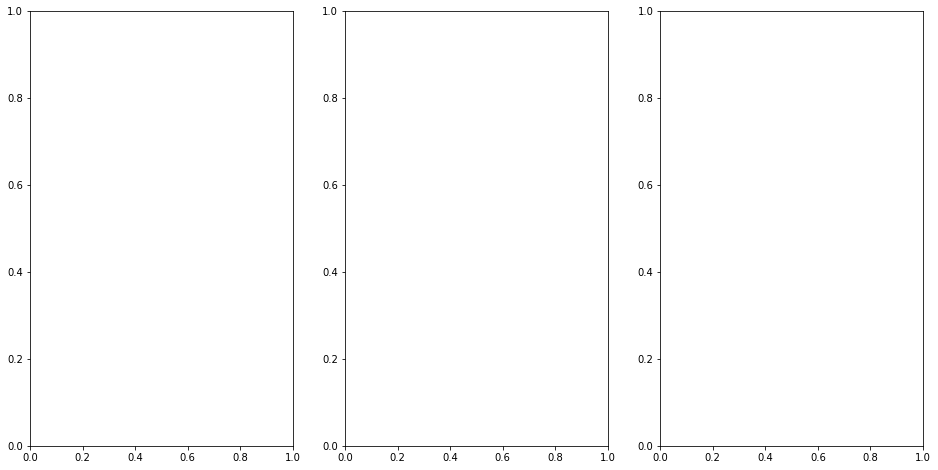

In [16]:
#df_test.to_csv("./Busan_Data/Gwangan/GwangAnBridge_1H(for xgboost)")

fig, axs = plt.subplots(figsize=(16,8), ncols=3, nrows=1, squeeze=False)
features = ['temperature', 'salinity', 'condolence']
print(axs)
for i, feature in enumerate(features):
    row = 0
    print(row)
    col = i%4
    print(col)
    sns.regplot(x=feature, y='electricPotential', data=df_test, ax=axs[row][col])

In [17]:
#Prophet 모델링
df_prophet2 = df_prophet.rename(columns = {'dateTime' :'ds', 'electricPotential' : 'y'})
#df_prophet2.to_csv("./Busan_Data/Gwangan//GwangAnBridge_1H(for prophet)")

df_prophet2.head()

,ds,temperature,salinity,condolence,y
6386,2021-01-05 10:27:14,NaN,NaN,NaN,867.0
6390,2021-01-05 10:30:48,NaN,NaN,NaN,867.0
6422,2021-01-05 11:01:51,NaN,NaN,NaN,868.0
6429,2021-01-05 11:07:30,NaN,NaN,NaN,868.0
6484,2021-01-05 12:01:31,NaN,NaN,NaN,867.0


<AxesSubplot:xlabel='ds'>

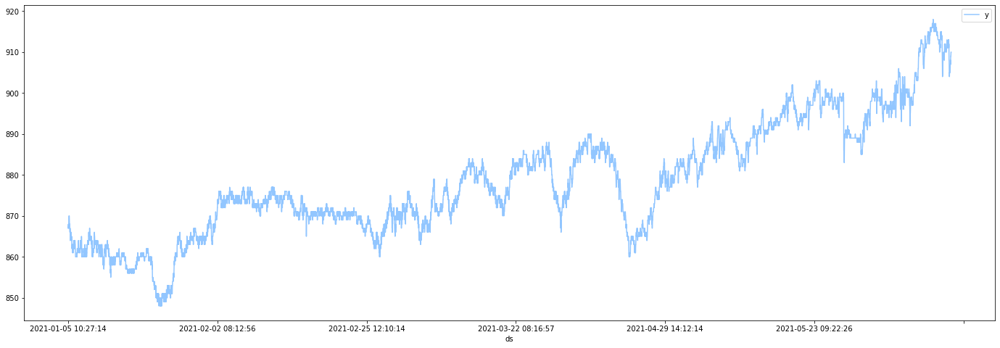

In [18]:
ax = plt.gca()
#df_test2.plot(kind='line', x='ds', y='y', ax=ax,label='electricPotential', figsize=(24,8))

df_prophet2.plot(kind='line', x='ds', y='y', ax=ax, figsize=(24,8))

In [19]:
#df_prophet2.loc[(df_prophet2['ds'] > '2020-12-24') & (df_prophet2['ds'] < '2021-01-05'), 'y'] = None
df_prophet2.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 11835 entries, 6386 to 190655
Data columns (total 5 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   ds           11835 non-null  object 
 1   temperature  0 non-null      float64
 2   salinity     0 non-null      float64
 3   condolence   0 non-null      float64
 4   y            11835 non-null  float64
dtypes: float64(4), object(1)
memory usage: 554.8+ KB


In [20]:
from prophet import Prophet
from prophet.plot import add_changepoints_to_plot

df_prophet2['cap'] = 1000
df_prophet2['floor'] = 700

model = Prophet(growth='logistic', weekly_seasonality=28,daily_seasonality=15,yearly_seasonality=10, 
                seasonality_mode='additive', seasonality_prior_scale = 3, changepoint_prior_scale=0.1, interval_width=0.80, mcmc_samples=2)
model.add_seasonality(name='monthly', period=30.5, fourier_order=30)

model.fit(df_prophet2, control={'max_treedepth': 10})


To run all diagnostics call pystan.check_hmc_diagnostics(fit)
/home/sqeng/venv/lib/python3.8/site-packages/pystan/diagnostics.py:217: RuntimeWarning: invalid value encountered in true_divide
  e_bfmi = numer / denom


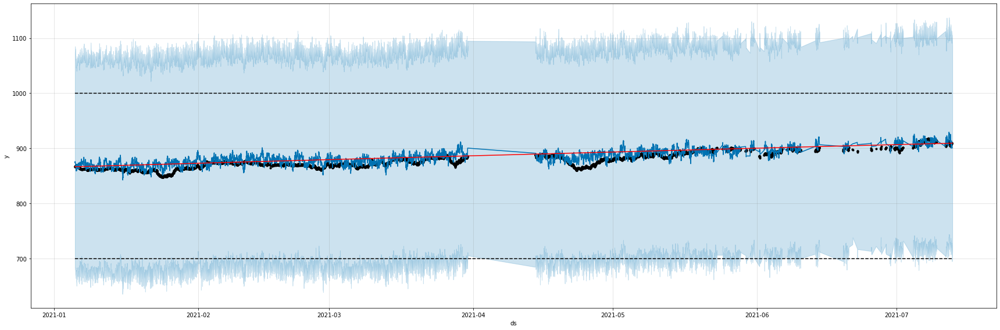

In [21]:
#forecast_t = forecast['ds'].dt.to_pydatetime()
future = model.make_future_dataframe(periods=2, freq='H')
future['cap'] = 1000
future['floor'] = 700
forecast = model.predict(future)

forecast.tail()
fig1 = model.plot(forecast, figsize=(24,8))
changepoint = add_changepoints_to_plot(fig1.gca(), model, forecast)


In [22]:
forecast

,ds,trend,cap,floor,yhat_lower,yhat_upper,trend_lower,trend_upper,additive_terms,additive_terms_lower,...,weekly,weekly_lower,weekly_upper,yearly,yearly_lower,yearly_upper,multiplicative_terms,multiplicative_terms_lower,multiplicative_terms_upper,yhat
0,2021-01-05 10:27:14,866.754873,1000,700,685.352249,1047.024960,866.455730,867.026800,7.198854,-2.783887,...,3.343294,-7.076566,15.142498,2.680830,-2.049455,6.586432,0.0,0.0,0.0,873.953727
1,2021-01-05 10:30:48,866.755470,1000,700,680.559496,1074.616297,866.456328,867.027405,7.662283,-2.607412,...,3.487620,-6.790455,15.158098,2.680568,-2.050123,6.586267,0.0,0.0,0.0,874.417753
2,2021-01-05 11:01:51,866.760662,1000,700,683.219665,1069.878712,866.461536,867.032668,9.500687,-2.705159,...,4.376405,-4.308986,14.293713,2.678270,-2.055934,6.584785,0.0,0.0,0.0,876.261350
3,2021-01-05 11:07:30,866.761607,1000,700,683.929395,1084.953559,866.462483,867.033626,9.071404,-2.953602,...,4.463554,-3.876790,13.953374,2.677849,-2.056988,6.584507,0.0,0.0,0.0,875.833011
4,2021-01-05 12:01:31,866.770640,1000,700,683.206782,1076.772455,866.471542,867.042783,8.956691,-3.285238,...,4.173386,-0.525705,8.514694,2.673773,-2.067032,6.581717,0.0,0.0,0.0,875.727331
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
11830,2021-07-12 23:04:44,909.396691,1000,700,704.142476,1094.955783,907.800620,911.878589,-4.914699,-20.774791,...,4.504824,-9.299086,18.669398,0.633577,-2.530122,3.007391,0.0,0.0,0.0,904.481992
11831,2021-07-12 23:09:48,909.397426,1000,700,702.084233,1100.924601,907.801326,911.879375,-5.216117,-21.609122,...,4.315742,-9.708923,18.680248,0.633302,-2.531377,3.007439,0.0,0.0,0.0,904.181309
11832,2021-07-12 23:14:46,909.398146,1000,700,695.247464,1100.298369,907.802018,911.880145,-5.435402,-22.349002,...,4.120119,-10.081944,18.640928,0.633032,-2.532607,3.007486,0.0,0.0,0.0,903.962745
11833,2021-07-13 00:14:46,909.406851,1000,700,704.822262,1105.686189,907.810379,911.889453,-7.060043,-27.634697,...,1.648100,-11.924133,15.212506,0.629794,-2.547433,3.008043,0.0,0.0,0.0,902.346808


In [24]:
from sklearn.metrics import mean_squared_error, r2_score

r2 = r2_score(df_prophet2.y, forecast.yhat)
mse = mean_squared_error(df_prophet2.y, forecast.yhat)
rmse = np.sqrt(mse)
nrmse = rmse * (100/df_prophet2.y.mean())

print('MSE : {0:.3F}, RMSE : {1:.3F}, NRMSE : {2:.3F}'.format(mse,rmse,nrmse))
print('R2-Score :{:.3f}'.format(r2))

def mean_absolute_percentage_error(y_true, y_pred): 
    """Calculates MAPE given y_true and y_pred"""
    y_true, y_pred = np.array(y_true), np.array(y_pred)
    mape = np.mean(np.abs((y_true - y_pred) / y_true)) * 100
    return print('MAPE : {0:.3F}'.format(mape))

mean_absolute_percentage_error(df_prophet2.y,
                   forecast.yhat)

MSE : 108.943, RMSE : 10.438, NRMSE : 1.188
R2-Score :0.437
MAPE : 0.958


In [141]:
from prophet.plot import plot_plotly, plot_components_plotly

plot_plotly(model,forecast)

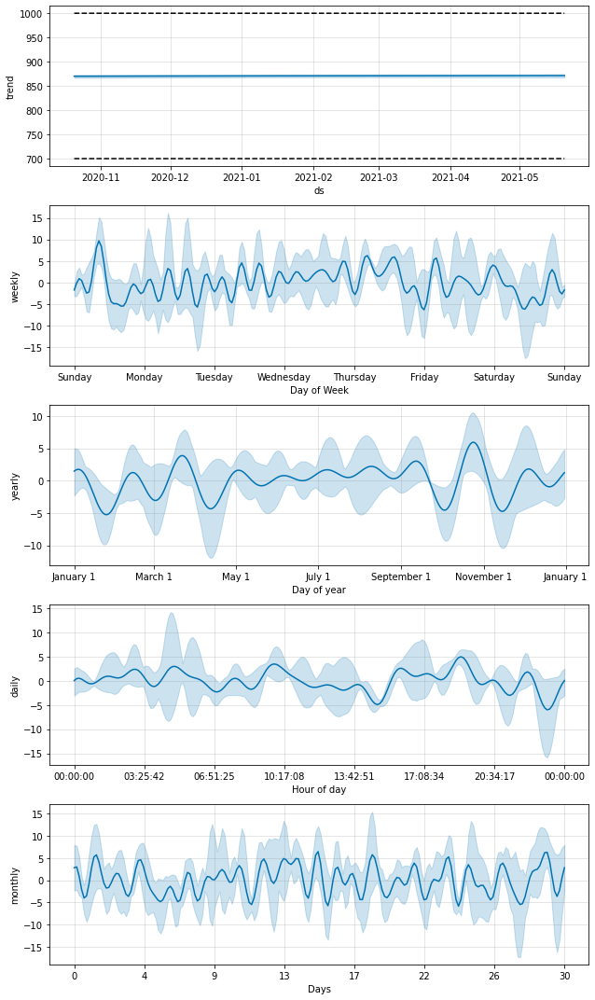

In [61]:
fig2 = model.plot_components(forecast)